In [1]:
import os
import torch
from torch.utils.data import DataLoader, Dataset
import pytorch_lightning as pl
from transformers import AutoConfig, AutoImageProcessor, AutoModelForObjectDetection
from pycocotools.coco import COCO
from PIL import Image, ImageDraw, ImageFont
import torchvision
from pytorch_lightning.callbacks import ModelCheckpoint
from torchmetrics.detection import MeanAveragePrecision
# --- NEW IMPORT ---
from collections import Counter
import warnings
warnings.filterwarnings("ignore")
import matplotlib.pyplot as plt
import torchmetrics
from tqdm import tqdm
import traceback

In [ ]:
class CFG:
    MODEL_CHECKPOINT = "PekingU/rtdetr_r18vd"
    TRAIN_ANNOTATION_PATH = "/Users/satwato.dey/Documents/assignment_data_bdd/bdd100k_images_100k/bdd100k/images/100k/train/_annotations.coco.json"
    VAL_ANNOTATION_PATH = "/Users/satwato.dey/Documents/assignment_data_bdd/bdd100k_images_100k/bdd100k/images/100k/val/_annotations.coco.json"
    TRAIN_IMG_DIR = "/Users/satwato.dey/Documents/assignment_data_bdd/bdd100k_images_100k/bdd100k/images/100k/train/"
    VAL_IMG_DIR = "/Users/satwato.dey/Documents/assignment_data_bdd/bdd100k_images_100k/bdd100k/images/100k/val/"
    TRAINED_MODEL_PATH = "/Users/satwato.dey/Downloads/rtdetr-bdd-best-epoch=06-val_loss=5.1101.ckpt"
    BATCH_SIZE = 16
    NUM_WORKERS = 0
    LEARNING_RATE = 1e-5
    WEIGHT_DECAY = 1e-4
    MAX_EPOCHS = 10

In [3]:
class RTDETR_FineTuner(pl.LightningModule):
    # --- MODIFICATION: Accept class_weights ---
    def __init__(self, config, num_classes, class_names, class_weights=None):
        super().__init__()
        self.cfg = config
        self.class_names = class_names
        # --- THE FIX IS HERE: Modify config BEFORE loading the model ---
        # 1. Load the configuration
        model_config = AutoConfig.from_pretrained(
            self.cfg.MODEL_CHECKPOINT,
            num_labels=num_classes,
        )
        
        # 2. Update the config with our class weights
        if class_weights is not None:
            print("Applying custom class weights to the model's configuration.")
            # The 'alpha' parameter of the Focal Loss is used for class weighting
            model_config.focal_alpha = class_weights.tolist() # Must be a list for the config
            
        # 3. Load the model using the MODIFIED config
        self.model = AutoModelForObjectDetection.from_pretrained(
            self.cfg.MODEL_CHECKPOINT,
            config=model_config,
            ignore_mismatched_sizes=True # Still needed to replace the head
        )
        # ------------------------------------------------------------------
        
        # self.image_processor = AutoImageProcessor.from_pretrained(self.cfg.MODEL_CHECKPOINT)
        self.val_map_metric = MeanAveragePrecision(box_format="cxcywh", class_metrics=True)
        self.save_hyperparameters()

    def forward(self, pixel_values, pixel_mask=None):
        # ... (no changes here)
        return self.model(pixel_values=pixel_values, pixel_mask=pixel_mask)

    def training_step(self, batch, batch_idx):
        # ... (no changes here)
        outputs = self.model(pixel_values=batch['pixel_values'], pixel_mask=batch.get('pixel_mask'), labels=batch['labels'])
        loss = outputs.loss
        self.log('train_loss', loss, on_step=True, on_epoch=True, prog_bar=True, logger=True)
        return loss

    def validation_step(self, batch, batch_idx):
        outputs = self.model(pixel_values=batch['pixel_values'], pixel_mask=batch.get('pixel_mask'), labels=batch['labels'])
        loss = outputs.loss
        self.log('val_loss', loss, on_step=True, on_epoch=True, prog_bar=True, logger=True)
        return loss
    
    # def on_validation_epoch_end(self):
    #     # ... (no changes here)
    #     print("\nComputing mAP...")
    #     map_stats = self.val_map_metric.compute()
    #     self.log('map', map_stats['map'], prog_bar=True, on_epoch=True)
    #     print(map_stats['map'])
    #     for k, v in map_stats.items():
    #         if k in ['map_per_class', 'mar_100_per_class'] and v.numel() > 1:
    #             if self.class_names and len(v) == len(self.class_names):
    #                 for i, class_name in enumerate(self.class_names):
    #                     self.log(f"metrics/{k}/{class_name}", v[i].item())
    #             else: self.log(f"metrics/{k}_mean", v.mean().item()) 
    #         elif isinstance(v, torch.Tensor) and v.numel() == 1:
    #             self.log(f"metrics/{k}", v.item())
    #     self.val_map_metric.reset()

    def configure_optimizers(self):
        # ... (no changes here)
        optimizer = torch.optim.AdamW(self.parameters(), lr=self.cfg.LEARNING_RATE, weight_decay=self.cfg.WEIGHT_DECAY)
        return optimizer


In [4]:
model = RTDETR_FineTuner.load_from_checkpoint("/Users/satwato.dey/Downloads/rtdetr-bdd-best-epoch=06-val_loss=5.1101.ckpt")

AttributeError: module '__main__' has no attribute 'CFG'

In [14]:
class BDDDataset(Dataset):
    def __init__(self, img_dir, annotation_path, image_processor):
        super().__init__()
        self.img_dir = img_dir
        self.coco = COCO(annotation_path)
        self.image_processor = image_processor
        self.ids = list(sorted(self.coco.imgs.keys()))
        self.cat_ids = sorted(self.coco.getCatIds())
        self.cat2label = {cat_id: i for i, cat_id in enumerate(self.cat_ids)}
        
    def __len__(self):
        return len(self.ids)

    def __getitem__(self, idx):
        img_id = self.ids[idx]
        img_info = self.coco.loadImgs(img_id)[0]
        path = os.path.join(self.img_dir, img_info['file_name'])
        image = Image.open(path).convert("RGB")
        orig_size = torch.tensor(image.size[::-1])
        ann_ids = self.coco.getAnnIds(imgIds=img_info['id'])
        annotations = self.coco.loadAnns(ann_ids)

        target = {'image_id': img_id, 'annotations': []}
        for ann in annotations:
            label = self.cat2label[ann['category_id']]
            target['annotations'].append({'bbox': ann['bbox'], 'category_id': label, 'area': ann['area']})

        processed_data = self.image_processor(images=image, annotations=target, return_tensors="pt")
        
        processed_data = {k: v[0] if k == 'labels' else v.squeeze(0) for k, v in processed_data.items()}
        
        processed_data['orig_size'] = orig_size
        processed_data['image_id'] = img_id
        processed_data['boxes_'] = target['annotations']
        return processed_data

In [19]:
class BDDDataModule(pl.LightningDataModule):
    def __init__(self, config):
        super().__init__()
        self.cfg = config
        self.image_processor = AutoImageProcessor.from_pretrained(self.cfg.MODEL_CHECKPOINT, use_fast=True)
        self.class_names = []
        # --- NEW: To store calculated weighats ---
        self.class_weights = None
        # ----------------------------------------

    def setup(self, stage=None):
        if stage == 'fit' or stage is None:
            self.train_dataset = BDDDataset(img_dir=self.cfg.TRAIN_IMG_DIR, annotation_path=self.cfg.TRAIN_ANNOTATION_PATH, image_processor=self.image_processor)
            self.val_dataset = BDDDataset(img_dir=self.cfg.VAL_IMG_DIR, annotation_path=self.cfg.VAL_ANNOTATION_PATH, image_processor=self.image_processor)
            self.class_names = [self.train_dataset.coco.cats[cat_id]['name'] for cat_id in self.train_dataset.cat_ids]
            
            # --- THE FIRST FIX IS HERE: Calculate class weights ---
            print("Calculating class weights for loss function...")
            all_cat_ids = self.train_dataset.coco.getAnnIds()
            all_anns = self.train_dataset.coco.loadAnns(all_cat_ids)
            class_counts = Counter(ann['category_id'] for ann in all_anns)
            
            # Get counts in the same order as our cat2label mapping
            sorted_counts = torch.tensor([class_counts.get(cat_id, 1) for cat_id in self.train_dataset.cat_ids], dtype=torch.float32)
            
            # Calculate weights using inverse frequency. Add epsilon for stability.
            # The more frequent a class, the smaller its weight.
            total_samples = sorted_counts.sum()
            self.class_weights = total_samples / (len(self.class_names) * sorted_counts + 1e-6)
            
            print(f"Calculated Weights: {self.class_weights.tolist()}")
            # --------------------------------------------------------

        print(f"Number of training examples: {len(self.train_dataset)}")
        print(f"Number of validation examples: {len(self.val_dataset)}")
        print(f"Class Names: {self.class_names}")

    def collate_fn(self, batch):
        # ... (no changes here)
        pixel_values = torch.stack([item['pixel_values'] for item in batch])
        labels = [item['labels'] for item in batch]
        image_ids = [item['image_id'] for item in batch] 
        orig_sizes = torch.stack([item['orig_size'] for item in batch])
        orig_boxes = [item['boxes_'] for item in batch]
        pixel_mask = torch.stack([item['pixel_mask'] for item in batch]) if 'pixel_mask' in batch[0] else None
        return {'pixel_values': pixel_values, 'pixel_mask': pixel_mask, 'labels': labels, 'orig_sizes': orig_sizes, 'image_id':image_ids, 'orig_boxes': orig_boxes}

    def train_dataloader(self):
        return DataLoader(self.train_dataset, batch_size=self.cfg.BATCH_SIZE, shuffle=True, num_workers=self.cfg.NUM_WORKERS, collate_fn=self.collate_fn)

    def val_dataloader(self):
        return DataLoader(self.val_dataset, batch_size=self.cfg.BATCH_SIZE, shuffle=False, num_workers=self.cfg.NUM_WORKERS, collate_fn=self.collate_fn)


Applying custom class weights to the model's configuration.


Some weights of RTDetrForObjectDetection were not initialized from the model checkpoint at PekingU/rtdetr_r18vd and are newly initialized because the shapes did not match:
- model.decoder.class_embed.0.bias: found shape torch.Size([80]) in the checkpoint and torch.Size([10]) in the model instantiated
- model.decoder.class_embed.0.weight: found shape torch.Size([80, 256]) in the checkpoint and torch.Size([10, 256]) in the model instantiated
- model.decoder.class_embed.1.bias: found shape torch.Size([80]) in the checkpoint and torch.Size([10]) in the model instantiated
- model.decoder.class_embed.1.weight: found shape torch.Size([80, 256]) in the checkpoint and torch.Size([10, 256]) in the model instantiated
- model.decoder.class_embed.2.bias: found shape torch.Size([80]) in the checkpoint and torch.Size([10]) in the model instantiated
- model.decoder.class_embed.2.weight: found shape torch.Size([80, 256]) in the checkpoint and torch.Size([10, 256]) in the model instantiated
- model.deno

Successfully loaded trained model from /Users/satwato.dey/Downloads/rtdetr-bdd-best-epoch=06-val_loss=5.1101.ckpt
loading annotations into memory...
Done (t=3.94s)
creating index...
index created!
loading annotations into memory...
Done (t=0.34s)
creating index...
index created!
Calculating class weights for loss function...
Calculated Weights: [0.6914312243461609, 0.536898672580719, 0.18043342232704163, 1.4087412357330322, 11.025282859802246, 4.293720722198486, 28.489505767822266, 17.848419189453125, 42.867122650146484, 946.2286987304688]
Number of training examples: 69863
Number of validation examples: 10000
Class Names: ['traffic light', 'traffic sign', 'car', 'person', 'bus', 'truck', 'rider', 'bike', 'motor', 'train']

Starting mAP calculation on the validation set...


Calculating mAP: 625it [1:20:50,  7.76s/it]



mAP Calculation Complete.

Overall mAP: 0.2709
Overall mAP@.50 (PASCAL VOC): 0.4907
Overall mAP@.75 (Strict): 0.2526

--- Average Precision (AP) per Class ---

An error occurred during mAP computation: Boolean value of Tensor with more than one value is ambiguous
This can happen if the validation set contains classes not seen by the model,
or if there are no predictions/ground truths for any batch.


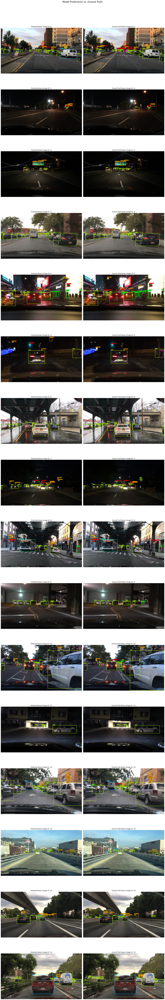

In [27]:
def draw_boxes(image, boxes, labels, scores, color_map):
    """Draws bounding boxes on an image."""
    img_with_boxes = image.copy()
    draw = ImageDraw.Draw(img_with_boxes)
    try:
        font = ImageFont.truetype("arial.ttf", 15)
    except IOError:
        font = ImageFont.load_default()

    for box, label, score in zip(boxes, labels, scores):
        color = color_map.get(label, "white")
        draw.rectangle(box, outline=color, width=3)
        text = f"{label}: {score:.2f}"
        text_bbox = draw.textbbox((box[0], box[1] - 15), text, font=font)
        draw.rectangle(text_bbox, fill=color)
        draw.text((box[0], box[1] - 15), text, fill="black", font=font)
    return img_with_boxes

def visualize_predictions(config, model, data_module, num_images=4):
    """Loads data, runs inference, and plots the results."""
    # 1. Setup DataModule
    
    val_loader = data_module.val_dataloader()
    id2label = {i: name for i, name in enumerate(data_module.class_names)}
    
    # Create a color map for classes
    colors = plt.cm.get_cmap('hsv', len(data_module.class_names))
    color_map = {name: tuple(int(c * 255) for c in colors(i)[:3]) for i, name in enumerate(data_module.class_names)}


    # 2. Get a batch of data
    batch = next(iter(val_loader))
    pixel_values = batch["pixel_values"]
    orig_sizes = batch["orig_sizes"]

    # 3. Run Inference
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model.to(device)
    model.eval()
    with torch.no_grad():
        outputs = model(pixel_values=pixel_values.to(device))

    # 4. Post-process results
    # The image_processor is key to converting model outputs to bounding boxes
    results = data_module.image_processor.post_process_object_detection(
        outputs, threshold=0.5, target_sizes=orig_sizes
    )

    # 5. Plot results
    fig, axes = plt.subplots(num_images, 2, figsize=(20, 8 * num_images))
    fig.suptitle("Model Predictions vs. Ground Truth", fontsize=20)

    for i in range(min(num_images, config.BATCH_SIZE)):
        # --- Get Predicted Boxes ---
        pred_scores = results[i]["scores"].cpu().tolist()
        pred_labels = [id2label[label.item()] for label in results[i]["labels"].cpu()]
        pred_boxes = results[i]["boxes"].cpu().tolist()

        # --- Get Ground Truth Boxes ---
        img_id = batch['image_id'][i]
        img_info = data_module.val_dataset.coco.loadImgs(img_id)[0]
        original_image = Image.open(os.path.join(config.VAL_IMG_DIR, img_info['file_name'])).convert("RGB")

        ann_ids = data_module.val_dataset.coco.getAnnIds(imgIds=img_id)
        annotations = data_module.val_dataset.coco.loadAnns(ann_ids)
        gt_boxes = []
        gt_labels = []
        trgs = []
        for ann in annotations:
            box = ann['bbox']
            gt_boxes.append([box[0], box[1], box[0] + box[2], box[1] + box[3]])
            cat_id = ann['category_id']
            gt_labels.append(data_module.val_dataset.coco.cats[cat_id]['name'])

        # --- Draw and Plot ---
        # Predictions
        img_pred = draw_boxes(original_image, pred_boxes, pred_labels, pred_scores, color_map)
        axes[i, 0].imshow(img_pred)
        axes[i, 0].set_title(f"Predicted Boxes (Image ID: {img_id})")
        axes[i, 0].axis("off")

        # Ground Truth
        img_gt = draw_boxes(original_image, gt_boxes, gt_labels, [1.0] * len(gt_labels), color_map)
        axes[i, 1].imshow(img_gt)
        axes[i, 1].set_title(f"Ground Truth Boxes (Image ID: {img_id})")
        axes[i, 1].axis("off")
        

    plt.tight_layout(rect=[0, 0.03, 1, 0.97])
    plt.show()

def ann_to_target(annotations):
    new_bboxes = []
    label_tensor = []
    for box in annotations:
        x1,y1, w, h = box['bbox']
        new_bboxes.append(torch.Tensor([x1,y1,x1+w, y1+h]))
        label_tensor.append(box['category_id'])
    return torch.stack(new_bboxes), torch.Tensor(label_tensor).int()
        
    
def calculate_and_print_map(model, data_module):
    """
    Calculates and prints the mean Average Precision (mAP) for the model
    on the entire validation dataset.
    """
    print("\nStarting mAP calculation on the validation set...")
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model.to(device)
    model.eval()

    # 1. Initialize the metric
    # class_metrics=True is essential for getting per-class AP
    map_metric = torchmetrics.detection.MeanAveragePrecision(class_metrics=True)
    
    val_loader = data_module.val_dataloader()
    id2label = {i: name for i, name in enumerate(data_module.class_names)}
    # ann_ids = data_module.val_dataset.coco.getAnnIds(imgIds=img_id)
    # annotations = data_module.val_dataset.coco.loadAnns(ann_ids )
    # 2. Loop over the entire validation set
    for i, batch in tqdm(enumerate(val_loader), desc="Calculating mAP"):
        # if i>20:
        #     break
        pixel_values = batch["pixel_values"].to(device)
        orig_sizes = batch["orig_sizes"]
        orig_boxes = batch["orig_boxes"]

        # Run inference
        with torch.no_grad():
            outputs = model(pixel_values=pixel_values)

        # Post-process predictions
        preds = data_module.image_processor.post_process_object_detection(
            outputs, threshold=0.2, target_sizes=orig_sizes
        )

        # Format ground truth to match torchmetrics' expected format
        # Expected format: list of dicts, each with 'boxes' and 'labels'
        targets = []
        # ann_to_target()
        for i in range(len(batch["labels"])):
            target_info = batch["labels"][i] # This is a dict with 'boxes' and 'class_labels'
            boxes, labels = ann_to_target(batch["orig_boxes"][i])
            targets.append({
                # 'boxes' : target_info['boxes'],
                'boxes':boxes,
                # 'labels': target_info['class_labels'],
                'labels': labels
                
            })
        # print(f"Pred: {preds}, \n targets: {targets}")
        # break
        # 3. Update the metric with the current batch's predictions and targets
        map_metric.update(preds, targets)

    # 4. Compute and print the final results
    print("\n" + "="*50)
    print("mAP Calculation Complete.")
    print("="*50)
    try:
        map_results = map_metric.compute()
    
        print(f"\nOverall mAP: {map_results['map'].item():.4f}")
        print(f"Overall mAP@.50 (PASCAL VOC): {map_results['map_50'].item():.4f}")
        print(f"Overall mAP@.75 (Strict): {map_results['map_75'].item():.4f}")

        print("\n--- Average Precision (AP) per Class ---")
        map_per_class = map_results.get('map_per_class', [])
        if map_per_class != -1: # Torchmetrics uses -1 if not calculated
            for i, ap in enumerate(map_per_class):
                class_name = id2label.get(i, f"Unknown Class {i}")
                print(f"  - {class_name:<15}: {ap.item():.4f}")
        else:
            print("Could not retrieve per-class AP. Check if 'class_metrics=True' is set.")
        
        print("\n--- Average Recall (AR) per Class ---")
        mar_per_class = map_results.get('mar_100_per_class', [])
        if mar_per_class != -1:
            for i, ar in enumerate(mar_per_class):
                class_name = id2label.get(i, f"Unknown Class {i}")
                print(f"  - {class_name:<15}: {ar.item():.4f}")

        print("\n" + "="*50)
        
    except Exception as e:
        print(f"\nAn error occurred during mAP computation: {e}")
        print("This can happen if the validation set contains classes not seen by the model,")
        print("or if there are no predictions/ground truths for any batch.")



if __name__ == '__main__':
    # 1. Instantiate Configuration
    cfg = CFG

    # 2. Load Your Trained Model
    #    You must replace `YourModelClass` with the actual class definition of your model.
    try:
        # For PyTorch Lightning, use .load_from_checkpoint
        model = RTDETR_FineTuner.load_from_checkpoint(cfg.TRAINED_MODEL_PATH)
        print(f"Successfully loaded trained model from {cfg.TRAINED_MODEL_PATH}")
        data_module = BDDDataModule(cfg)
        data_module.setup()
        calculate_and_print_map(model, data_module)
        # 3. Run Visualization
        visualize_predictions(cfg, model, data_module, num_images=cfg.BATCH_SIZE)

    except FileNotFoundError:
        print("-" * 80)
        print(f"ERROR: Could not find the model checkpoint file.")
        print(f"Please update 'TRAINED_MODEL_PATH' in the Config class to point to your .ckpt file.")
        print(f"Current path: '{cfg.TRAINED_MODEL_PATH}'")
        print("-" * 80)
    except Exception as e:
        print(traceback.format_exc())
        print("-" * 80)
        print(f"An error occurred: {e}")
        print("Please ensure the following:")
        print("1. All paths in the 'Config' class are correct.")
        print("2. You have replaced the placeholder 'YourModelClass' with your actual model's class.")
        print("-" * 80)

In [28]:
map_metric

NameError: name 'map_metric' is not defined

In [6]:
image_processor = AutoImageProcessor.from_pretrained("PekingU/rtdetr_r50vd", use_fast=True)

In [7]:
image = Image.open("/Users/satwato.dey/Documents/assignment_data_bdd/bdd100k_images_100k/bdd100k/images/100k/valid/b1c9c847-3bda4659.jpg")

In [8]:
inputs = image_processor(images=image, return_tensors="pt")

In [9]:
outputs = model.model(**inputs)

In [10]:
outputs['pred_boxes']

tensor([[[0.6644, 0.5149, 0.1396, 0.1897],
         [0.4079, 0.4668, 0.1022, 0.1988],
         [0.7922, 0.5821, 0.2951, 0.2821],
         ...,
         [0.0273, 0.4747, 0.0480, 0.0817],
         [0.1261, 0.4889, 0.1592, 0.1152],
         [0.6040, 0.4981, 0.0345, 0.1018]]], grad_fn=<SelectBackward0>)

In [11]:
target_sizes = torch.tensor([image.size[::-1]])

In [12]:
results = image_processor.post_process_object_detection(outputs, threshold=0.25, target_sizes=target_sizes)

In [13]:
results

[{'scores': tensor([0.9606, 0.9372, 0.9043, 0.8976, 0.8876, 0.8776, 0.8700, 0.8212, 0.7910,
          0.7842, 0.7700, 0.7651, 0.7326, 0.6425, 0.6051, 0.5822, 0.5184, 0.5154,
          0.5047, 0.4330, 0.4158, 0.3972, 0.3921, 0.3917, 0.3744, 0.3737, 0.3671,
          0.3613, 0.3547, 0.3532, 0.3399, 0.3322, 0.3075, 0.3067, 0.3063, 0.3021,
          0.2955, 0.2941, 0.2929, 0.2834, 0.2804, 0.2757, 0.2713, 0.2695, 0.2679,
          0.2669, 0.2588, 0.2538], grad_fn=<IndexBackward0>),
  'labels': tensor([2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 2, 2, 2, 1, 2, 1, 2, 1,
          5, 5, 2, 0, 2, 5, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 5, 2, 2, 2, 2, 1, 2, 1]),
  'boxes': tensor([[8.2519e+02, 3.1757e+02, 1.2029e+03, 5.2068e+02],
          [7.6107e+02, 3.0241e+02, 9.3974e+02, 4.3900e+02],
          [2.9822e+01, 3.3608e+02, 1.7101e+02, 4.1960e+02],
          [1.6134e+02, 3.4244e+02, 2.6460e+02, 4.0374e+02],
          [3.8613e+02, 3.3738e+02, 4.4829e+02, 3.7601e+02],
          [4.5667e+02, 2.6451e+02

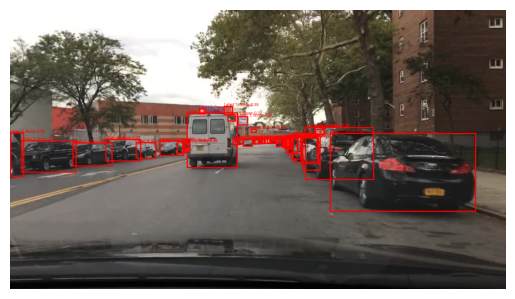

In [14]:
# --- Replace this with your image file ---
# Create a dummy image for demonstration purposes
# In your actual use, you would load your image like this:
# image = Image.open("your_image.jpg")

from PIL import Image, ImageDraw
import matplotlib.pyplot as plt

# Create a draw object
draw = ImageDraw.Draw(image)

# Iterate over the boxes, scores, and labels
for box, score, label in zip(results[0]['boxes'], results[0]['scores'], results[0]['labels']):
    # Get the coordinates
    xmin, ymin, xmax, ymax = box

    # Draw the bounding box
    draw.rectangle([xmin, ymin, xmax, ymax], outline="red", width=3)

    # You can also add the label and score
    label_text = f"Label: {label}, Score: {score:.2f}"
    draw.text((xmin, ymin - 10), label_text, fill="red")

# Display the image with bounding boxes
plt.imshow(image)
plt.axis('off') # Hide the axes
plt.show()